In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

from datetime import date
import hisepy
import numpy as np
import os
import pandas as pd
import re
import scanpy as sc

## Helper functions

In [2]:
def cache_uuid_path(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    if not os.path.isdir(cache_path):
        hise_res = hisepy.reader.cache_files([uuid])
    filename = os.listdir(cache_path)[0]
    cache_file = '{p}/{f}'.format(p = cache_path, f = filename)
    return cache_file

In [3]:
def read_csv_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_csv(cache_file)
    return res

In [4]:
def read_parquet_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_parquet(cache_file)
    return res

In [5]:
def read_adata_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = sc.read_h5ad(cache_file)
    return res

In [6]:
def backed_adata_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = sc.read_h5ad(cache_file, backed = 'r')
    return res

In [7]:
def rm_cache_uuid(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    rm_call = 'rm -r {d}'.format(d = cache_path)
    os.system(rm_call)

In [8]:
def format_cell_type(cell_type):
    cell_type = re.sub('\\+', 'pos', cell_type)
    cell_type = re.sub('-', 'neg', cell_type)
    cell_type = re.sub(' ', '_', cell_type)
    return cell_type

In [9]:
def filename_cell_type(filename):
    cell_type = re.sub('.+L3_','',filename)
    cell_type = re.sub('_2024.+','',cell_type)
    cell_type = re.sub('_', ' ', cell_type)
    cell_type = re.sub('pos','+', cell_type)
    cell_type = re.sub('neg','-', cell_type)
    return cell_type

In [10]:
def element_id(n = 3):
    import periodictable
    from random import randrange
    rand_el = []
    for i in range(n):
        el = randrange(0,118)
        rand_el.append(periodictable.elements[el].name)
    rand_str = '-'.join(rand_el)
    return rand_str

## Markers for dotplots

In [11]:
broad_markers = [
    'CD3D', # T cells
    'CD3E', # T cells/NK
    'FCN1', # Monocytes/Myeloid
    'HBB', # Erythrocytes
    'MS4A1', # B cells
    'CD79A', # B cells
    'PPBP', # Platelets
    'IFI44L' # ISG-high
]

In [20]:
class_markers = [
    'CD4',
    'CD8A',
    'CD27',
    'GZMB',
    'GZMK',
    'IFI44L',
    'KLRF1',
    'SOX4'
]

## Read cell type hierarchy

In [12]:
hierarchy_uuid = '1a44252c-8cab-4c8f-92c9-d8f3af633790'
hierarchy_df = read_csv_uuid(hierarchy_uuid)

## Identify files for use in HISE

In [17]:
search_id = 'tantalum-silicon-mendelevium'

Retrieve files stored in our HISE project store

In [14]:
ps_df = hisepy.list_files_in_project_store('cohorts')
ps_df = ps_df[['id', 'name']]

Filter for files from the previous notebook using our search_id

In [18]:
search_df = ps_df[ps_df['name'].str.contains(search_id)]
search_df = search_df.sort_values('name')
search_df['AIFI_L3'] = [filename_cell_type(f) for f in search_df['name']]

In [19]:
search_df['AIFI_L3'].tolist()

['CD8aa',
 'CM CD8 T cell',
 'Core naive CD8 T cell',
 'GZMK- CD27+ EM CD8 T cell',
 'GZMK+ CD27+ EM CD8 T cell',
 'ISG+ memory CD8 T cell',
 'ISG+ naive CD8 T cell',
 'KLRF1- GZMB+ CD27- EM CD8 T cell',
 'KLRF1+ GZMB+ CD27- EM CD8 T cell',
 'SOX4+ naive CD8 T cell']

## Review CD8aa

In [21]:
cell_type = 'CD8aa'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [22]:
type_uuid

'87cfaf24-6a9d-4627-94c7-dc9869cedb70'

In [23]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 87cfaf24-6a9d-4627-94c7-dc9869cedb70
Files have been successfully downloaded!


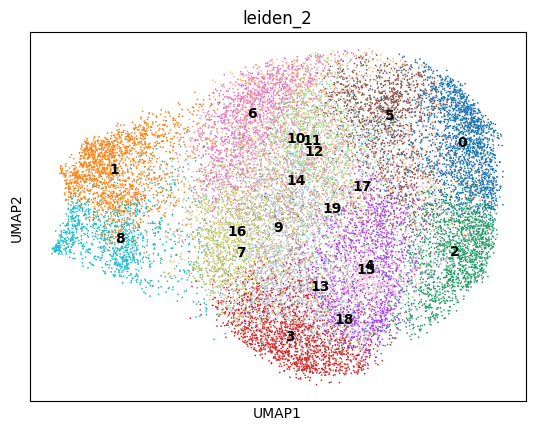

In [25]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

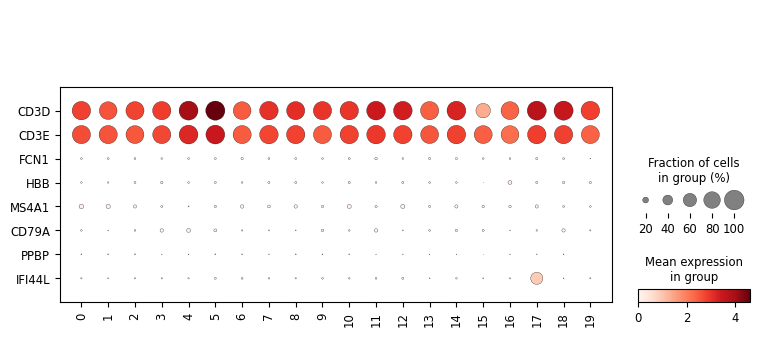

In [26]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

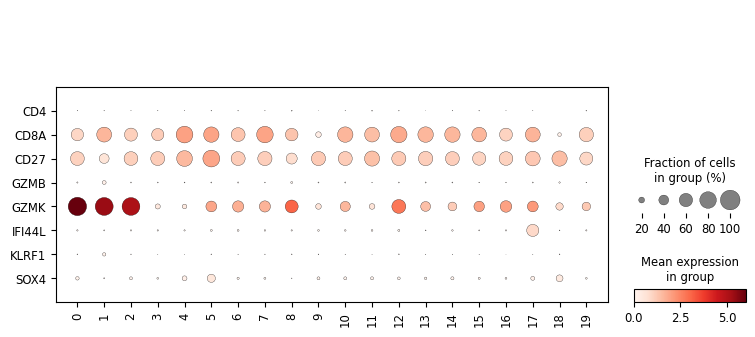

In [27]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

In [28]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     1908
1     1650
2     1637
3     1529
4     1366
5     1234
6     1181
7     1154
8     1099
9     1086
10     928
11     889
12     868
13     819
14     804
15     606
16     553
17     367
18     202
19      76
Name: count, dtype: int64

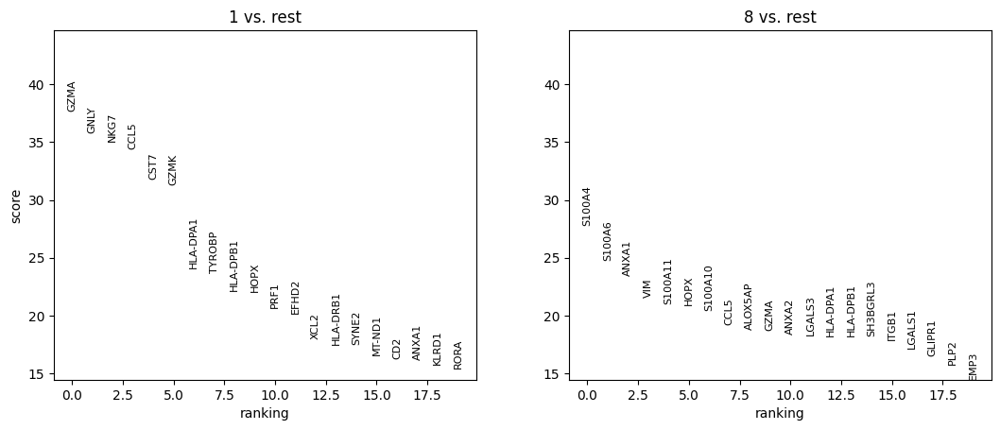

In [29]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['1','8']
)
sc.pl.rank_genes_groups(adata)

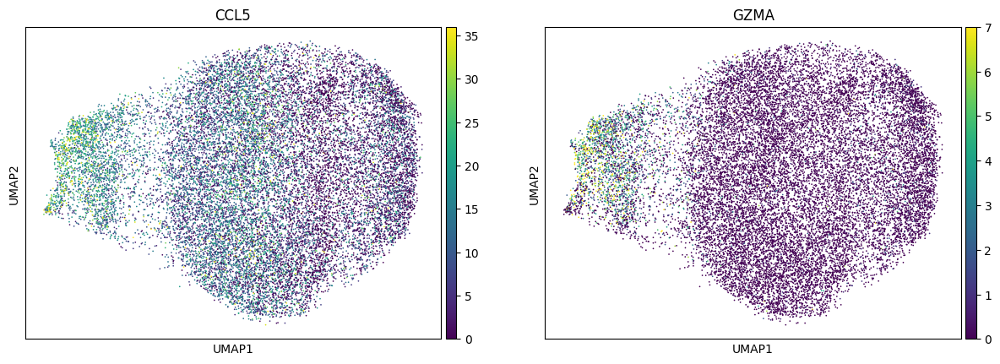

In [33]:
sc.pl.umap(adata, color = ['CCL5','GZMA'], vmax = 'p99', ncols = 2)

## Review CM CD8 T cell

In [34]:
cell_type = 'CM CD8 T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [35]:
type_uuid

'4ec77a6c-9f3e-4b84-ac6b-74b7bd067bfe'

In [36]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 4ec77a6c-9f3e-4b84-ac6b-74b7bd067bfe
Files have been successfully downloaded!


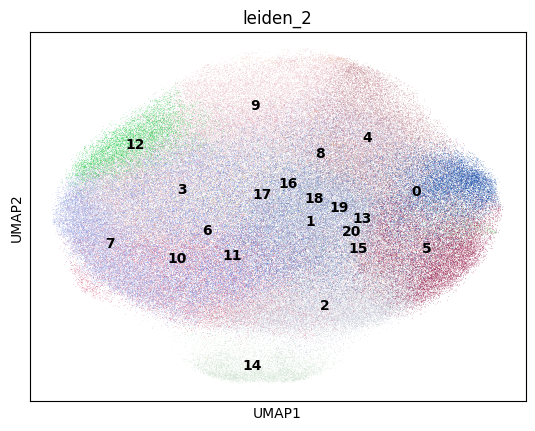

In [37]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

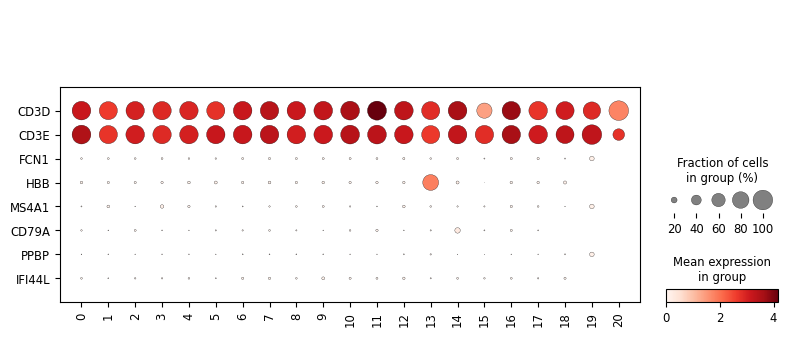

In [38]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

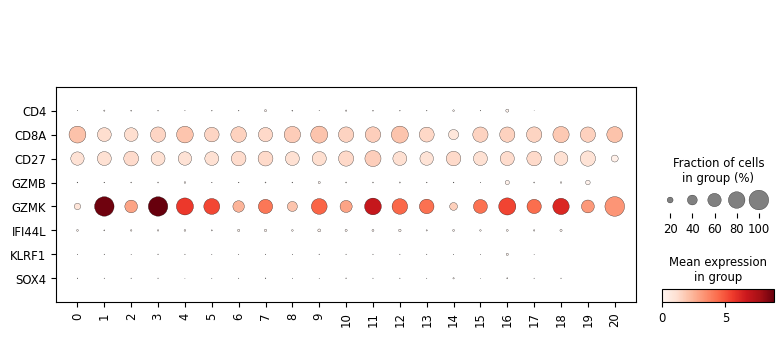

In [39]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

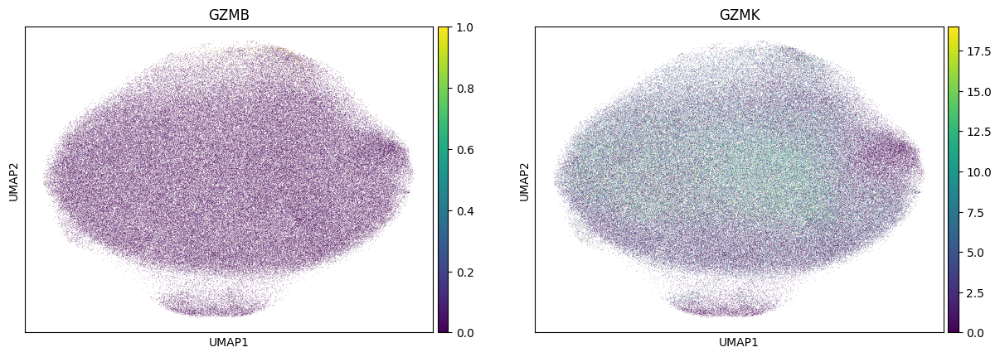

In [40]:
sc.pl.umap(adata, color = ['GZMB','GZMK'], vmax = 'p99')

In [41]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     18781
1     18654
2     18570
3     18416
4     17594
5     16515
6     15854
7     15402
8     13730
9     13721
10    13285
11    12221
12     7221
13     6437
14     6092
15     5360
16     2675
17      733
18       93
19        7
20        4
Name: count, dtype: int64

## Review Core naive CD8 T cell

In [42]:
cell_type = 'Core naive CD8 T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [43]:
type_uuid

'ad480bbd-97dc-4447-b924-57e72310b395'

In [44]:
adata = read_adata_uuid(type_uuid)

downloading fileID: ad480bbd-97dc-4447-b924-57e72310b395
Files have been successfully downloaded!


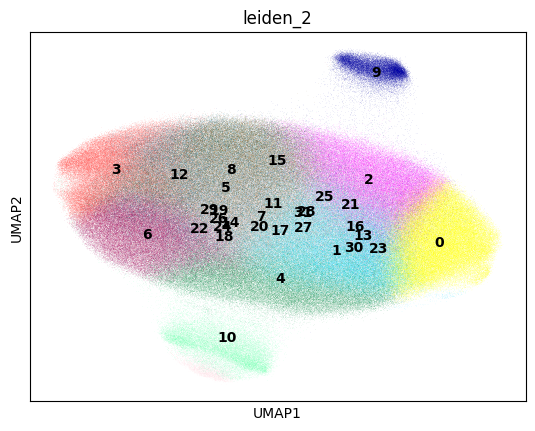

In [45]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

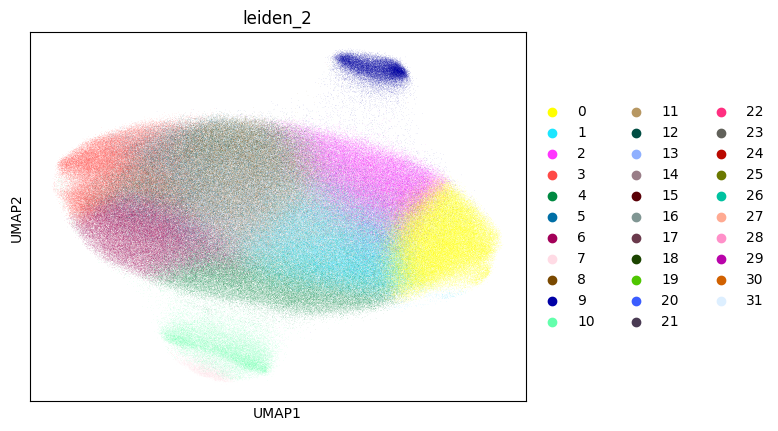

In [53]:
sc.pl.umap(adata, color = 'leiden_2')

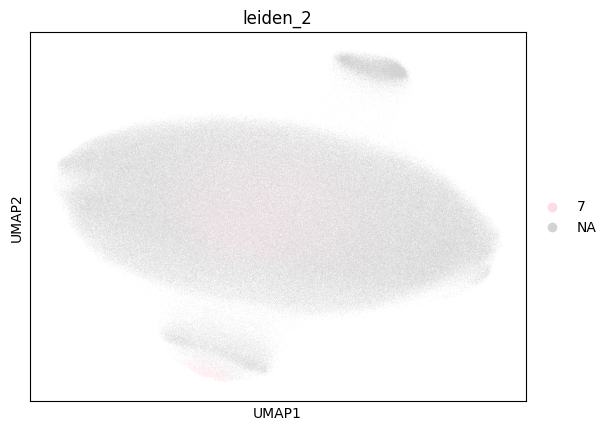

In [54]:
sc.pl.umap(adata, color = 'leiden_2', groups = '7')

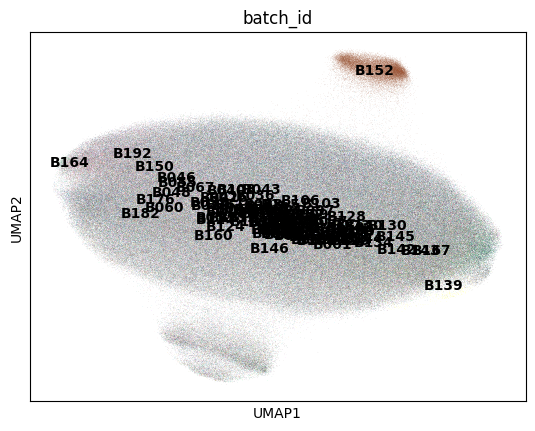

In [51]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

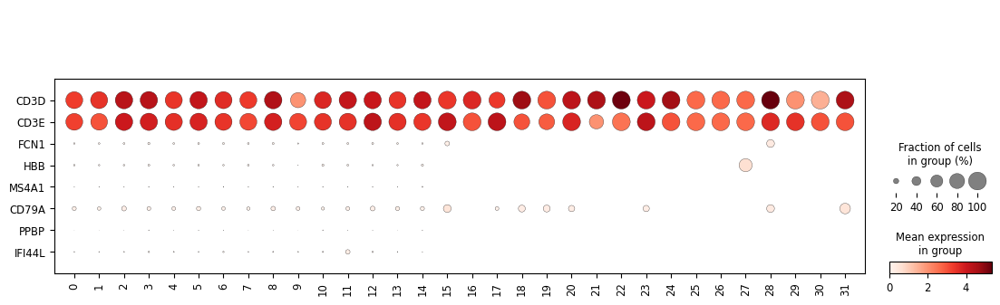

In [46]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

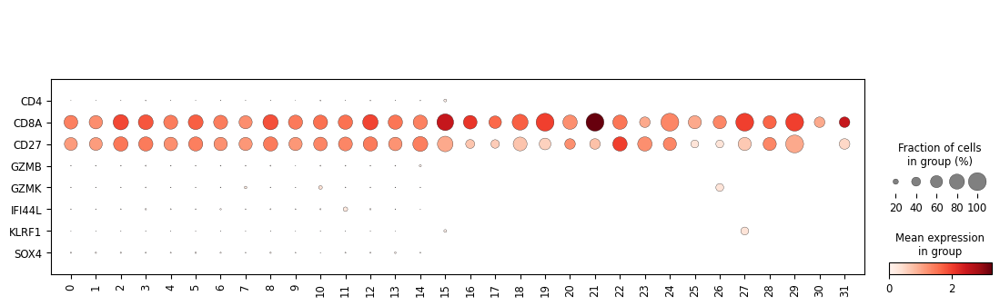

In [47]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

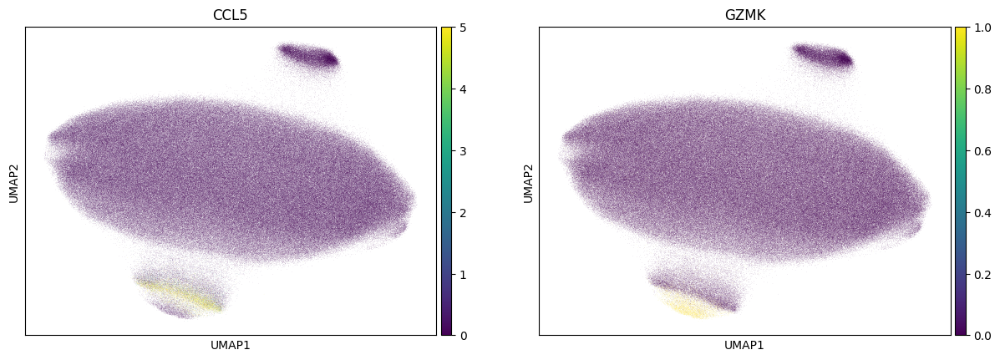

In [56]:
sc.pl.umap(adata, color = ['CCL5','GZMK'], vmax = 'p99')

In [57]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     94910
1     77517
2     74413
3     69432
4     67293
5     66597
6     61401
7     59049
8     56234
9     34858
10    33066
11    27715
12    25789
13     4024
14      138
15       12
16       10
17        8
18        7
19        7
20        4
21        4
22        4
23        4
24        3
25        3
26        3
27        3
28        3
29        2
30        2
31        2
Name: count, dtype: int64

## Review GZMK- CD27+ EM CD8 T cell

In [58]:
cell_type = 'GZMK- CD27+ EM CD8 T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [59]:
type_uuid

'bdb7cc5d-0812-43e2-a250-962224f3e2d6'

In [60]:
adata = read_adata_uuid(type_uuid)

downloading fileID: bdb7cc5d-0812-43e2-a250-962224f3e2d6
Files have been successfully downloaded!


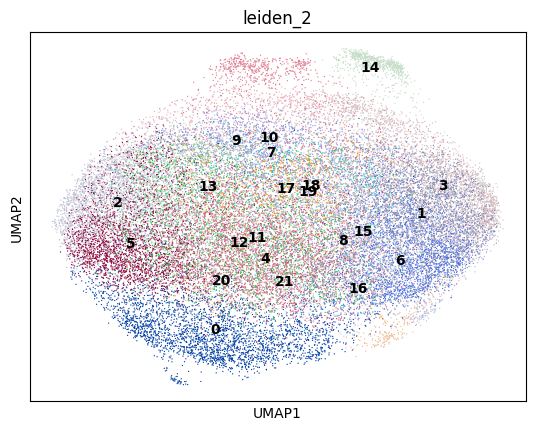

In [61]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

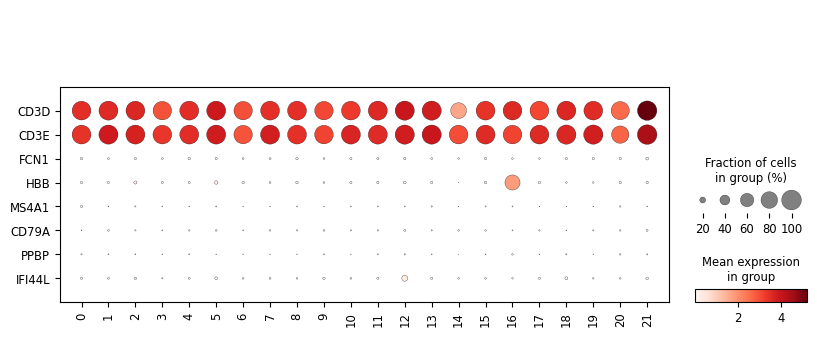

In [62]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

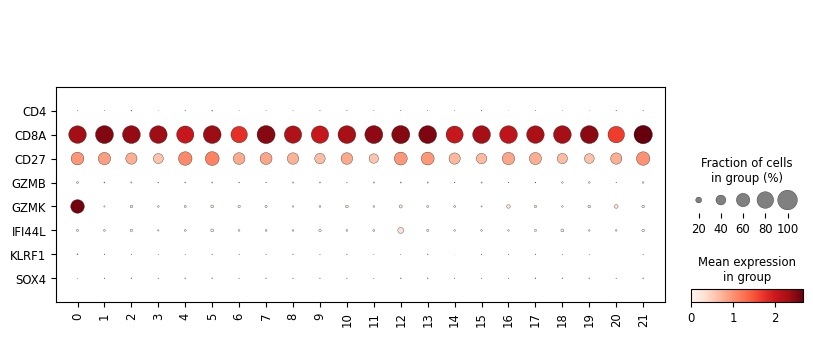

In [63]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

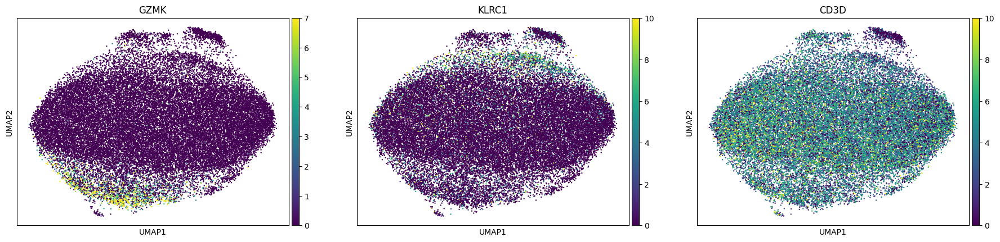

In [73]:
sc.pl.umap(adata, color = ['GZMK','KLRC1','CD3D'], vmax = 'p99', size = 12)

In [64]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     3193
1     2847
2     2845
3     2836
4     2834
5     2684
6     2246
7     1868
8     1790
9     1668
10    1549
11    1513
12    1401
13    1337
14     938
15     873
16     814
17     730
18     585
19     354
20     196
21     116
Name: count, dtype: int64

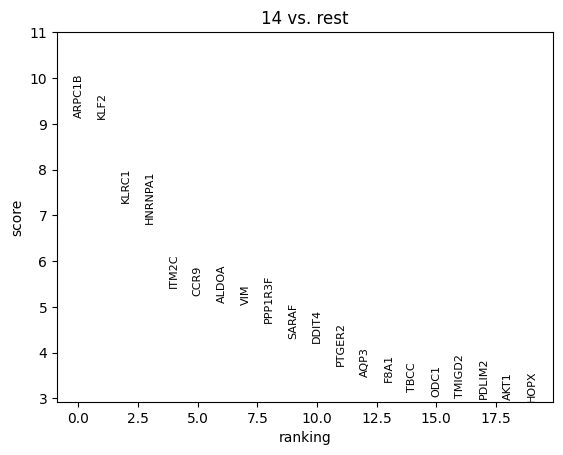

In [65]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['14']
)
sc.pl.rank_genes_groups(adata)

## Review GZMK+ CD27+ EM CD8 T cell

In [78]:
cell_type = 'GZMK+ CD27+ EM CD8 T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [79]:
type_uuid

'fc43bd5d-a792-4974-9a52-c5a213b9c331'

In [80]:
adata = read_adata_uuid(type_uuid)

downloading fileID: fc43bd5d-a792-4974-9a52-c5a213b9c331
Files have been successfully downloaded!


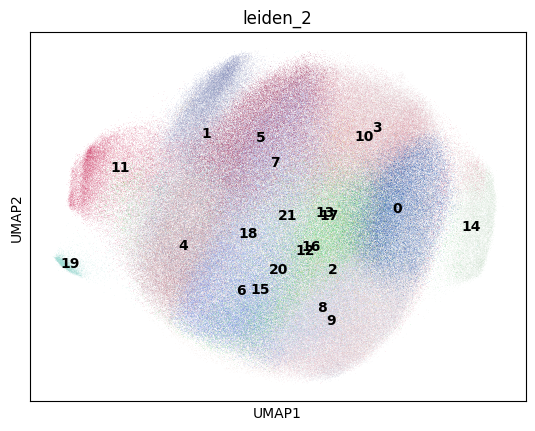

In [81]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

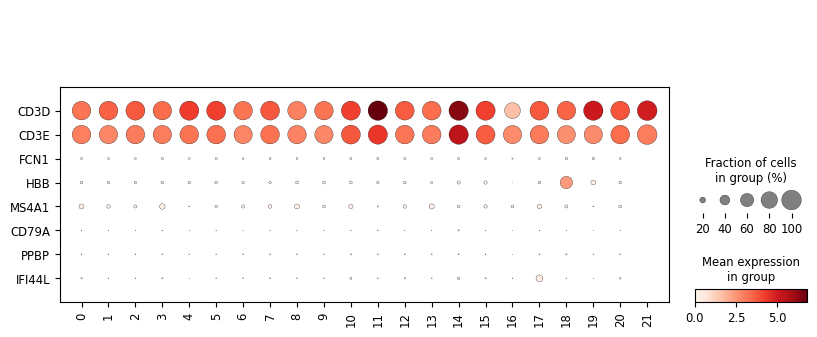

In [82]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

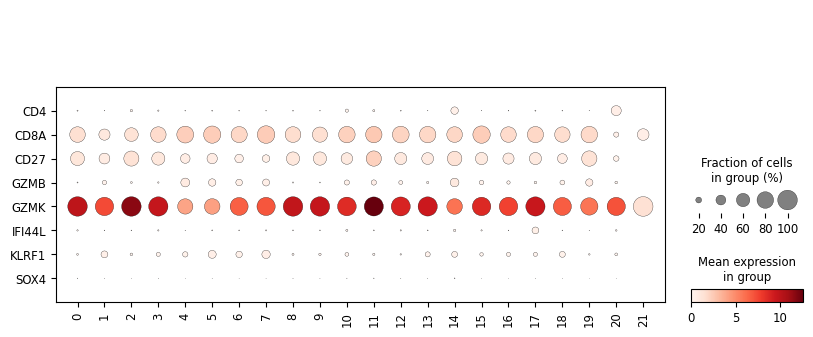

In [83]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

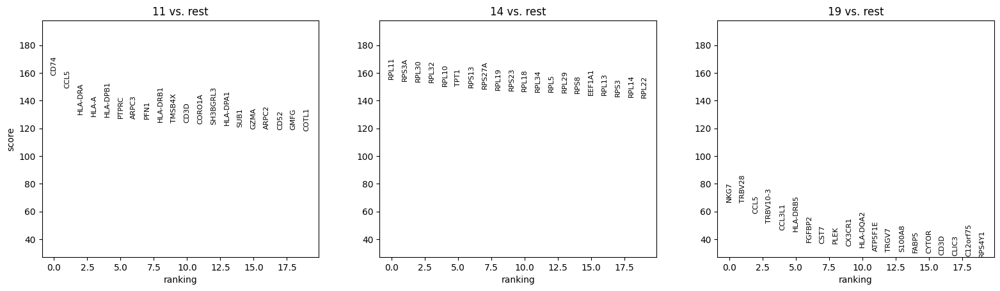

In [84]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['11','14','19']
)
sc.pl.rank_genes_groups(adata)

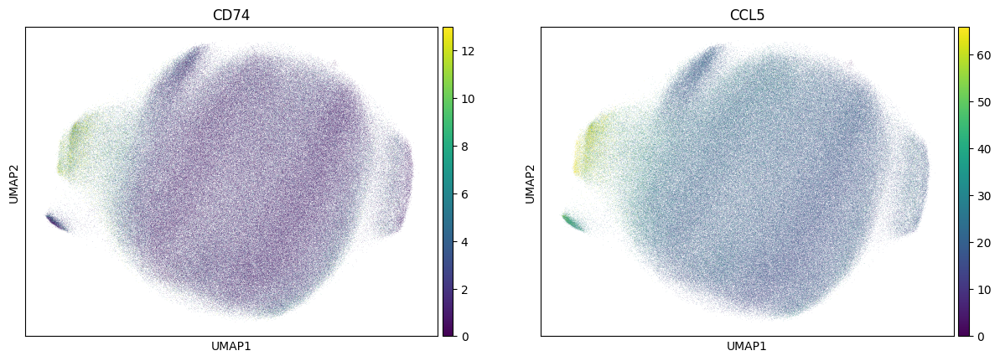

In [85]:
sc.pl.umap(adata, color = ['CD74','CCL5'], vmax = 'p99')

## Review ISG+ memory CD8 T cell

In [105]:
cell_type = 'ISG+ memory CD8 T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [106]:
type_uuid

'7a357af1-4791-4673-a0d6-a10a8a15cd6d'

In [107]:
adata = read_adata_uuid(type_uuid)

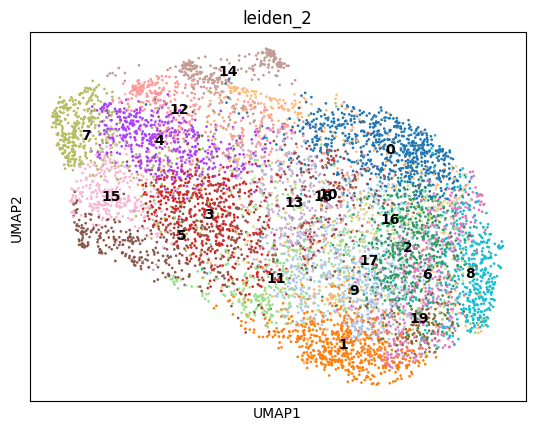

In [108]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

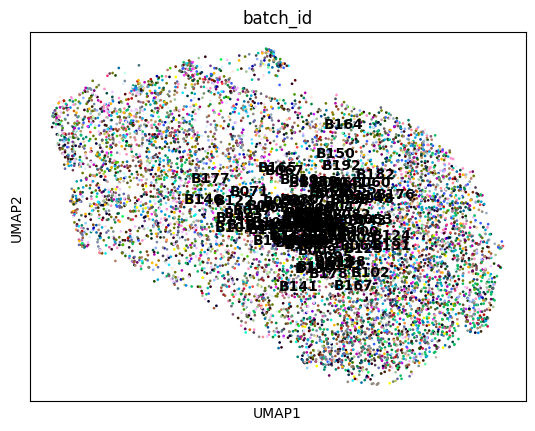

In [109]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

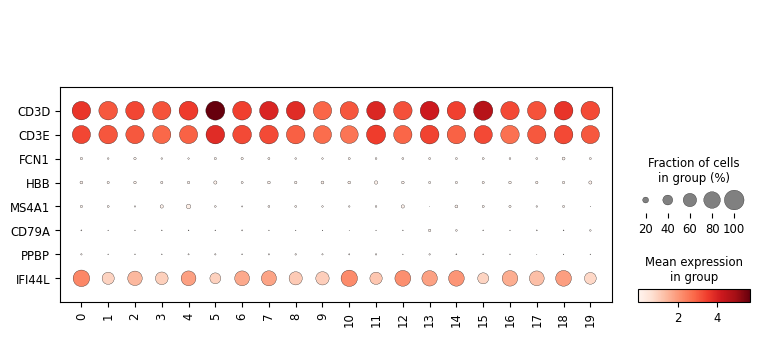

In [110]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

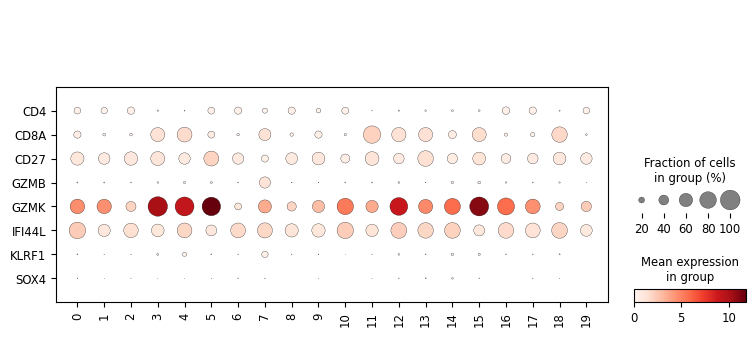

In [111]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

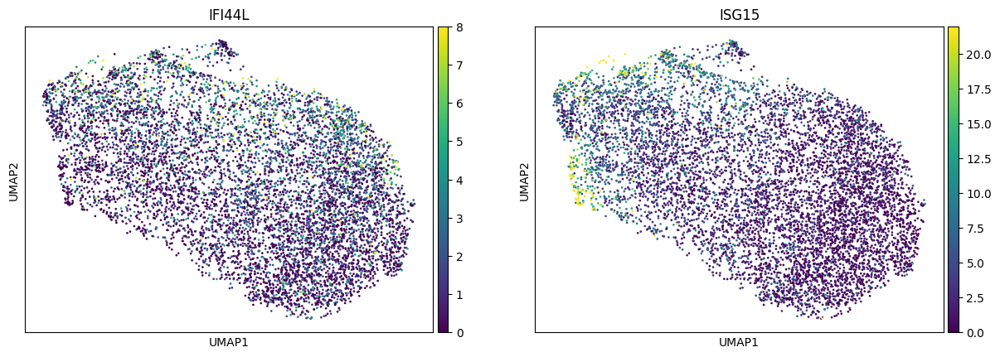

In [112]:
sc.pl.umap(adata, color = ['IFI44L','ISG15'], vmax = 'p99')

## Review ISG+ naive CD8 T cell

In [113]:
cell_type = 'ISG+ naive CD8 T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [114]:
type_uuid

'2dc30580-80d3-4133-ac53-aa65b55e4b95'

In [115]:
adata = read_adata_uuid(type_uuid)

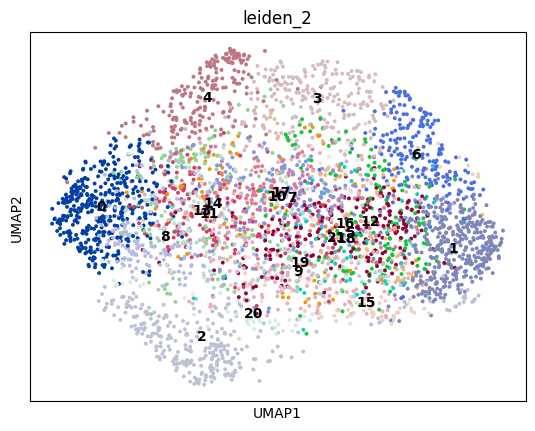

In [116]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

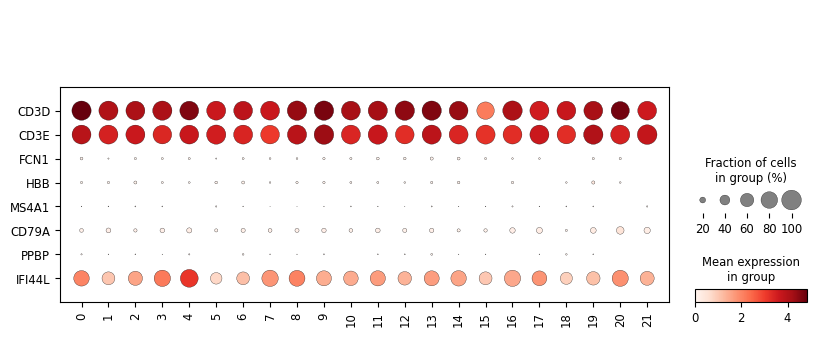

In [117]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

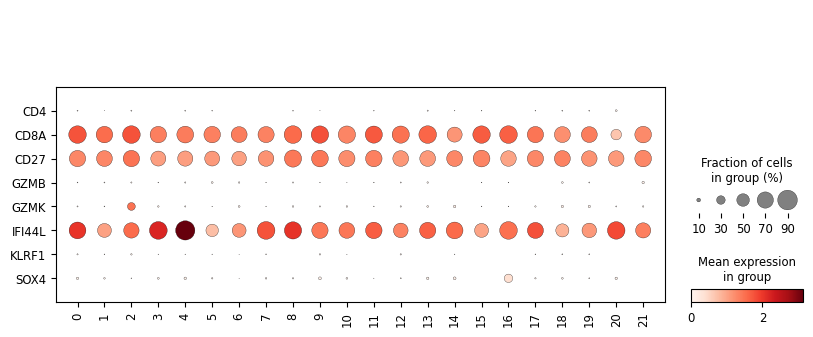

In [118]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

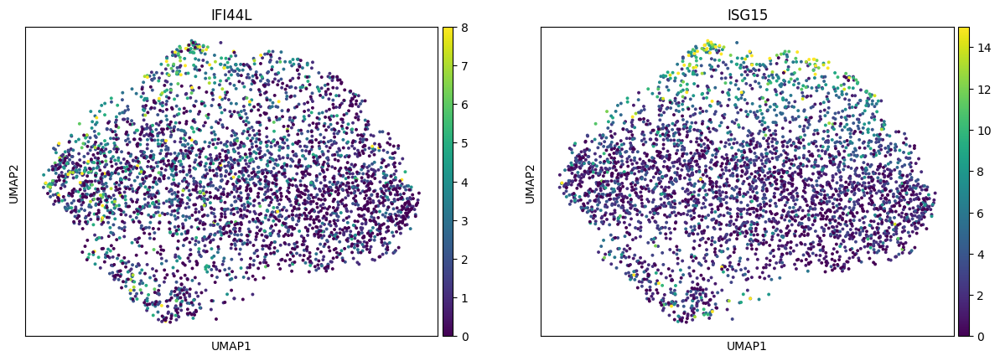

In [119]:
sc.pl.umap(adata, color = ['IFI44L','ISG15'], vmax = 'p99')

## Review KLRF1- GZMB+ CD27- EM CD8 T cell

In [144]:
cell_type = 'KLRF1- GZMB+ CD27- EM CD8 T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [145]:
type_uuid

'b5bf5444-4f61-4775-99d3-f0b708ba3952'

In [146]:
adata = read_adata_uuid(type_uuid)

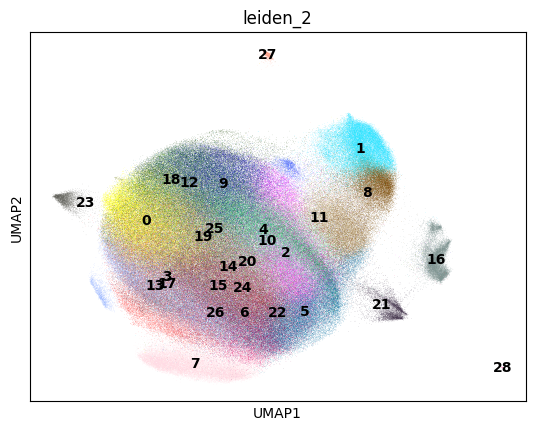

In [147]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

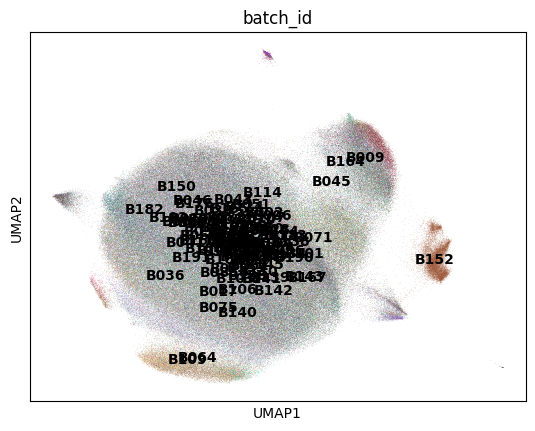

In [148]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

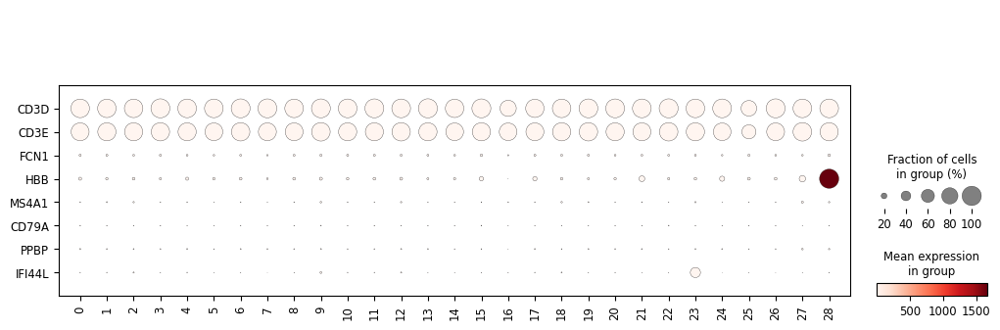

In [149]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

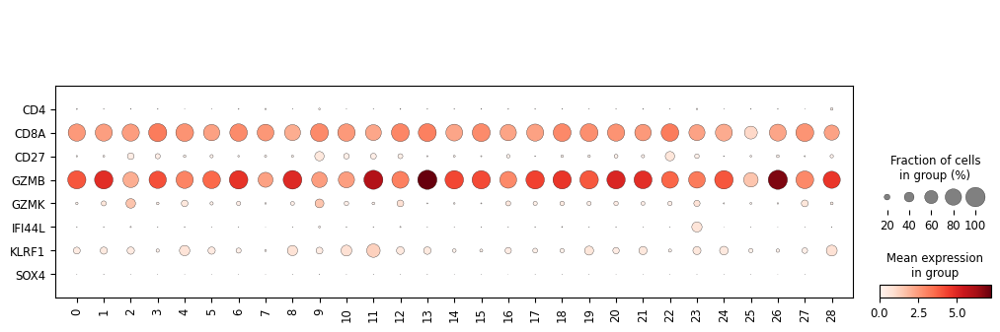

In [150]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

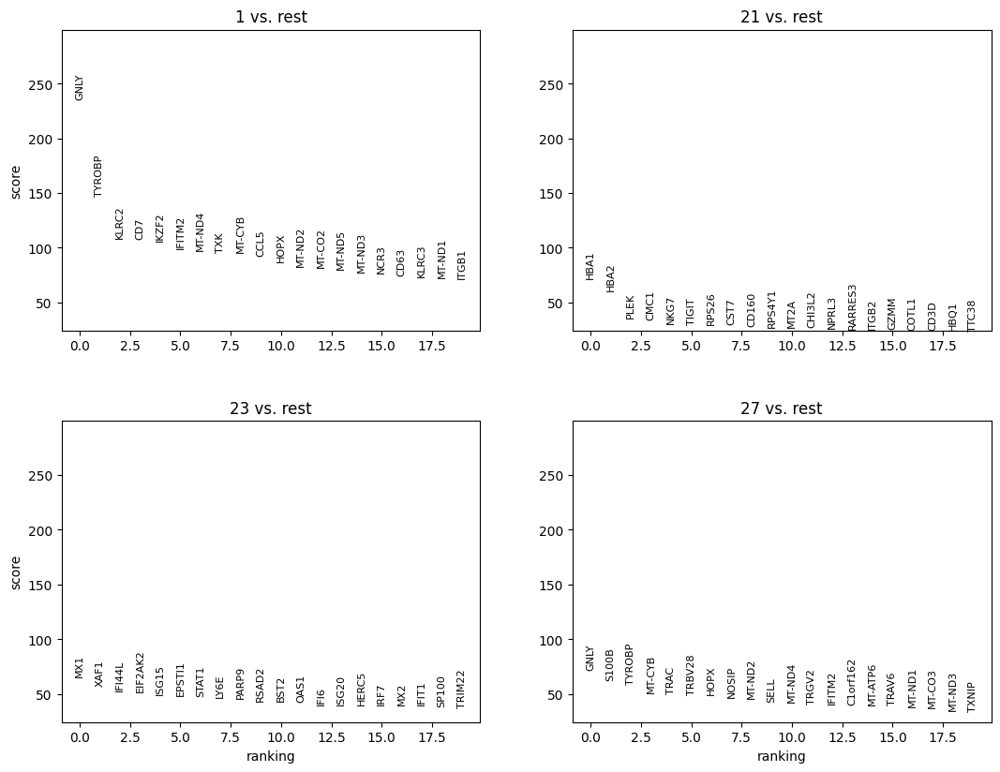

In [151]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['1','21','23','27']
)
sc.pl.rank_genes_groups(adata, ncols = 2)

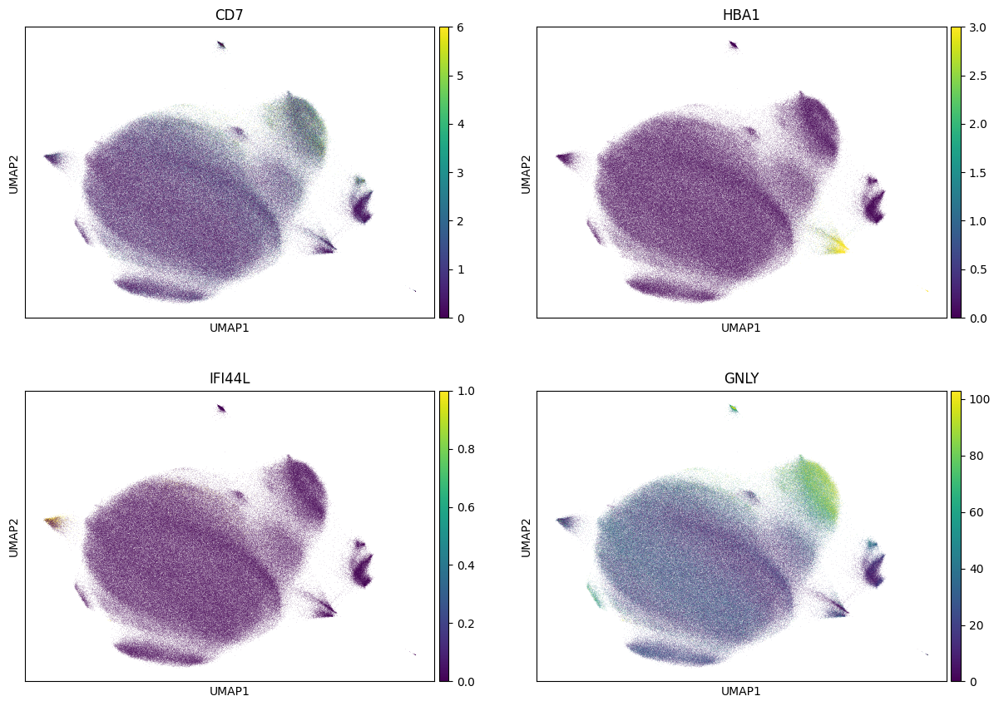

In [153]:
sc.pl.umap(adata, color = ['CD7','HBA1','IFI44L','GNLY'], vmax = 'p99', ncols = 2)

## Review KLRF1+ GZMB+ CD27- EM CD8 T cell

In [156]:
cell_type = 'KLRF1+ GZMB+ CD27- EM CD8 T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [157]:
type_uuid

'1d057e47-1da6-4e03-b39c-c67e3646342e'

In [158]:
adata = read_adata_uuid(type_uuid)

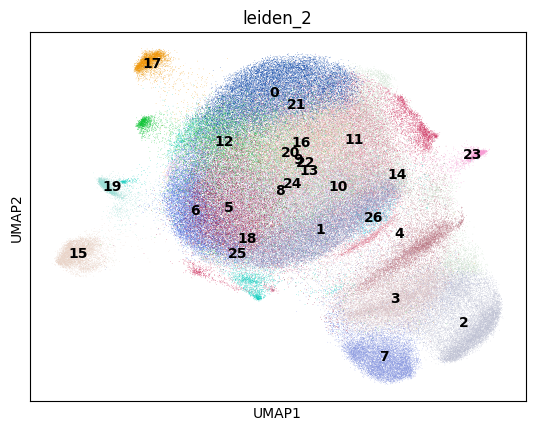

In [159]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

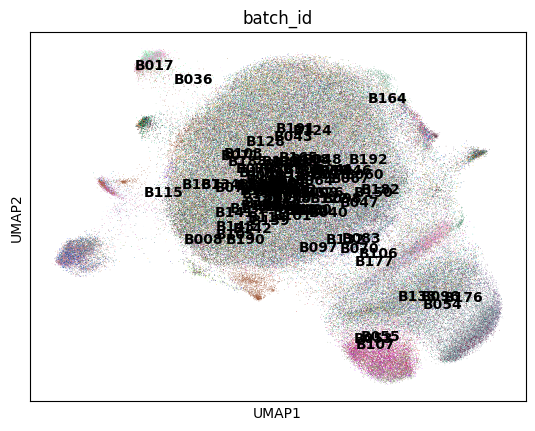

In [160]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

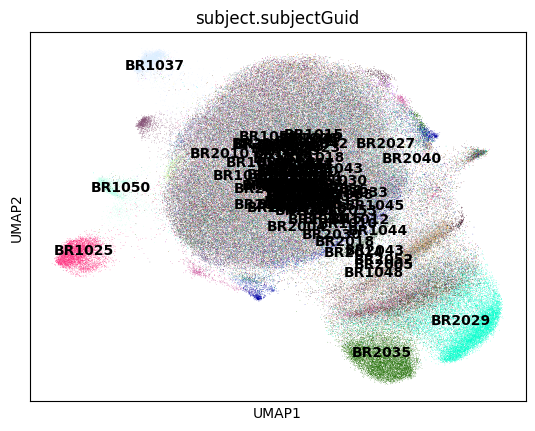

In [161]:
sc.pl.umap(adata, color = 'subject.subjectGuid', legend_loc = 'on data')

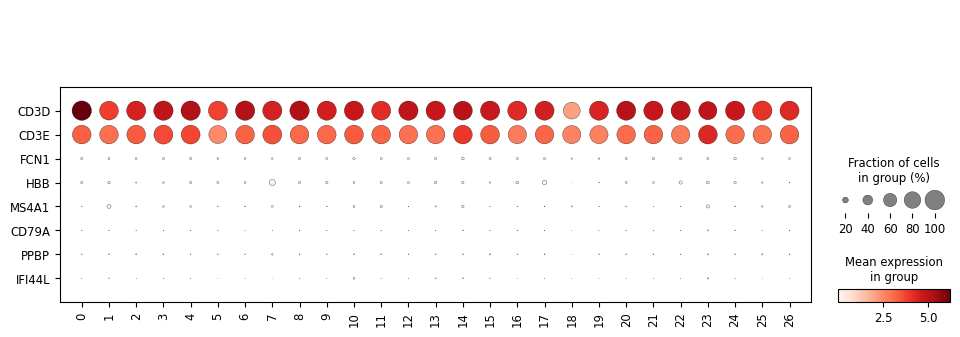

In [162]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

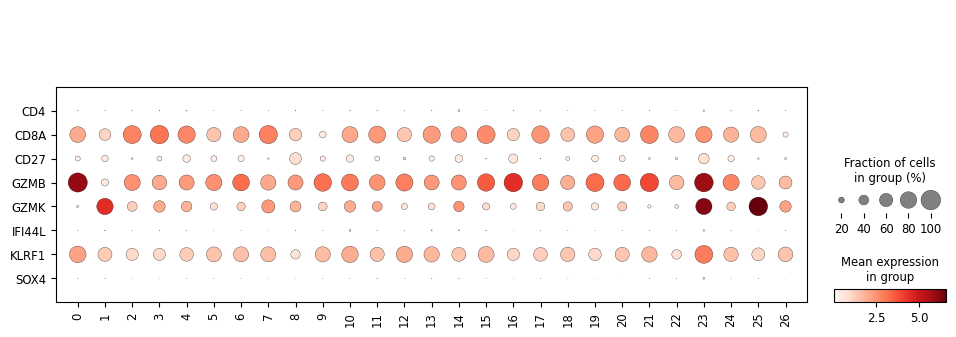

In [163]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

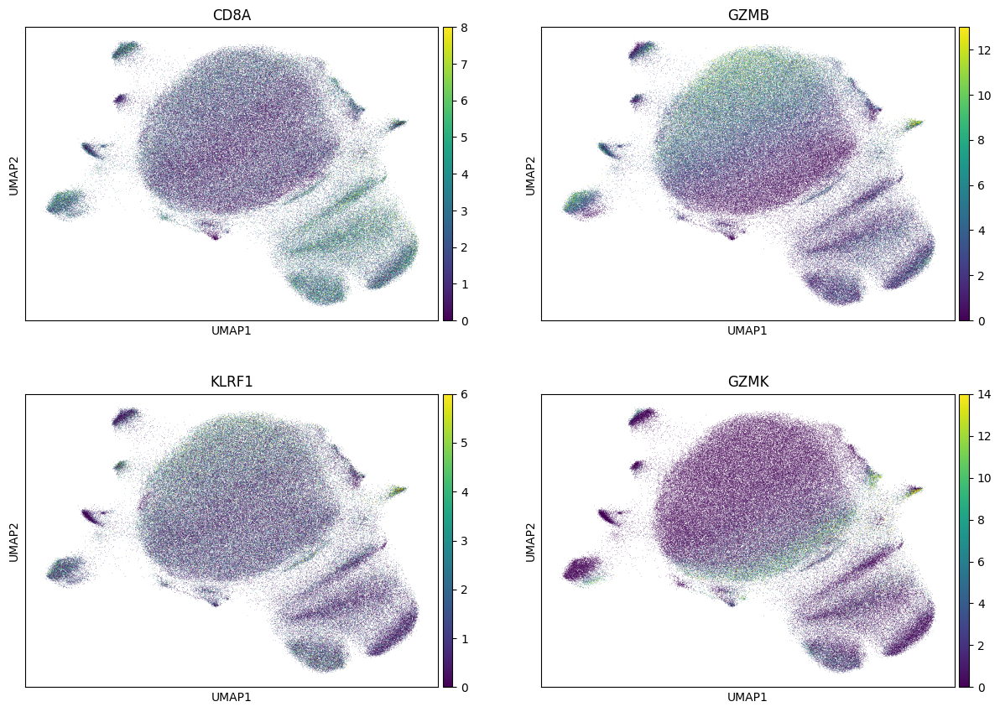

In [165]:
sc.pl.umap(adata, color = ['CD8A','GZMB','KLRF1','GZMK'], vmax = 'p99', ncols = 2)

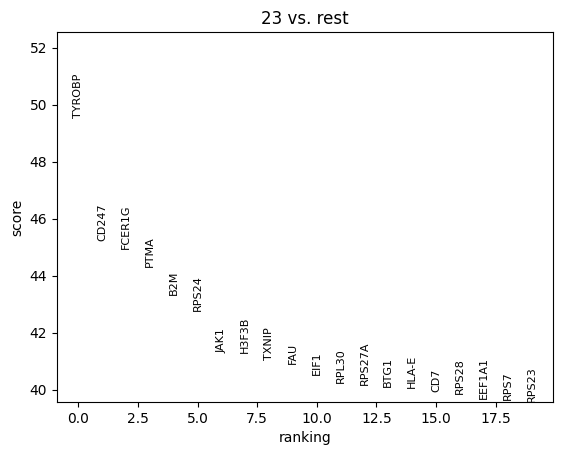

In [167]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['23']
)
sc.pl.rank_genes_groups(adata)

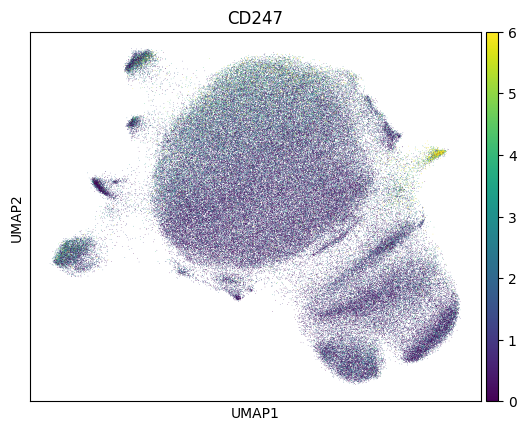

In [168]:
sc.pl.umap(adata, color = ['CD247'], vmax = 'p99', ncols = 2)

## Review SOX4+ naive CD8 T cell

In [169]:
cell_type = 'SOX4+ naive CD8 T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [170]:
type_uuid

'54fe95b9-48ee-4d4e-a189-210b3482f13b'

In [171]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 54fe95b9-48ee-4d4e-a189-210b3482f13b
Files have been successfully downloaded!


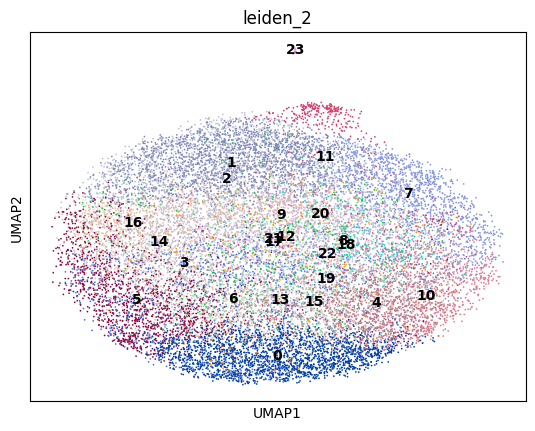

In [172]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

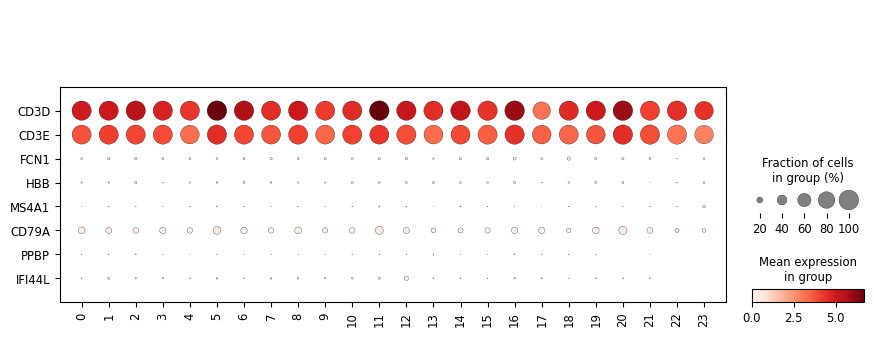

In [173]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

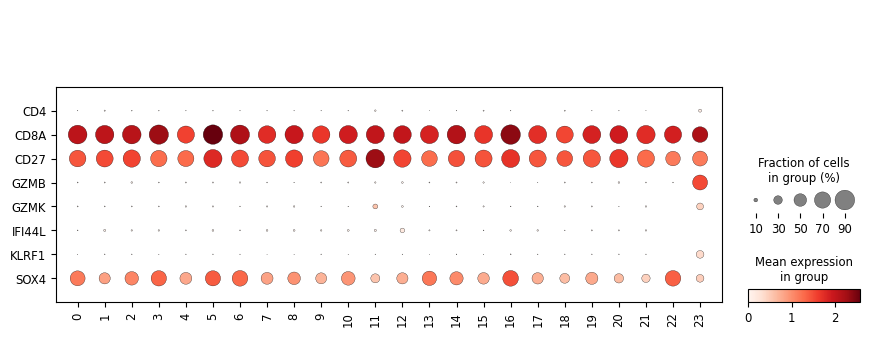

In [174]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

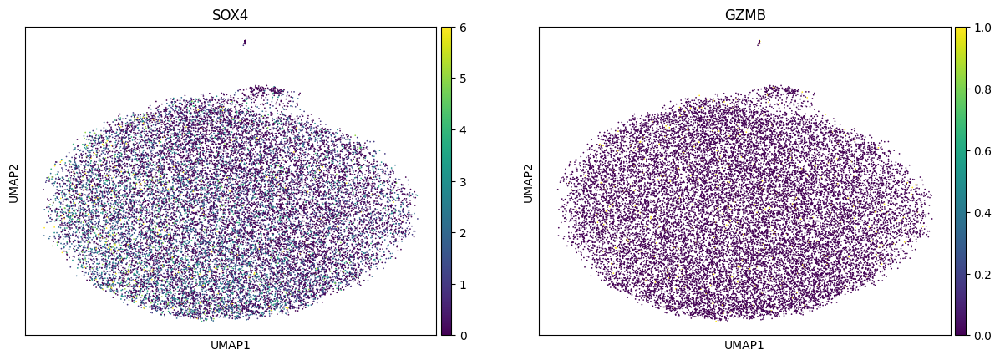

In [175]:
sc.pl.umap(adata, color = ['SOX4','GZMB'], vmax = 'p99')